# <span style='color:Red'>  ***DecissionTreeRegressor-AQI_Hyd.*** </span>

## <span style='color:Red'>  ***Necessities*** </span>

### <span style='color:Black'>  **Importing Libraries** </span>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### <span style='color:Black'>  **Read the file** </span>

In [2]:
df=pd.read_csv('Data/Real-Data/Real_Combine.csv')

## <span style='color:Red'>  ***Feature Engineering*** </span>

### <span style='color:Black'>  **Overview the attributes** </span>

In [3]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


### <span style='color:Black'>  **Check the null values** </span>

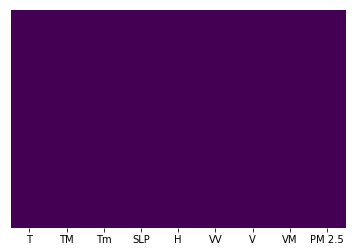

In [4]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [5]:
df=df.dropna()

In [6]:
X=df.iloc[:,:-1] ## independent features
y=df.iloc[:,-1] ## dependent features

In [7]:
X.isnull() ## checking the independent values for null values

,T,TM,Tm,SLP,H,VV,V,VM
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False


In [8]:
y.isnull()

0      False
1      False
2      False
3      False
4      False
5      False
6      False
7      False
8      False
9      False
10     False
11     False
12     False
13     False
14     False
15     False
16     False
17     False
18     False
19     False
20     False
21     False
22     False
23     False
24     False
25     False
26     False
27     False
28     False
29     False
       ...  
701    False
702    False
703    False
704    False
705    False
706    False
707    False
708    False
709    False
710    False
711    False
712    False
713    False
714    False
715    False
716    False
717    False
718    False
719    False
720    False
721    False
722    False
723    False
724    False
725    False
726    False
727    False
728    False
729    False
730    False
Name: PM 2.5, Length: 730, dtype: bool

### <span style='color:Black'>  **Visualizing the above** </span>

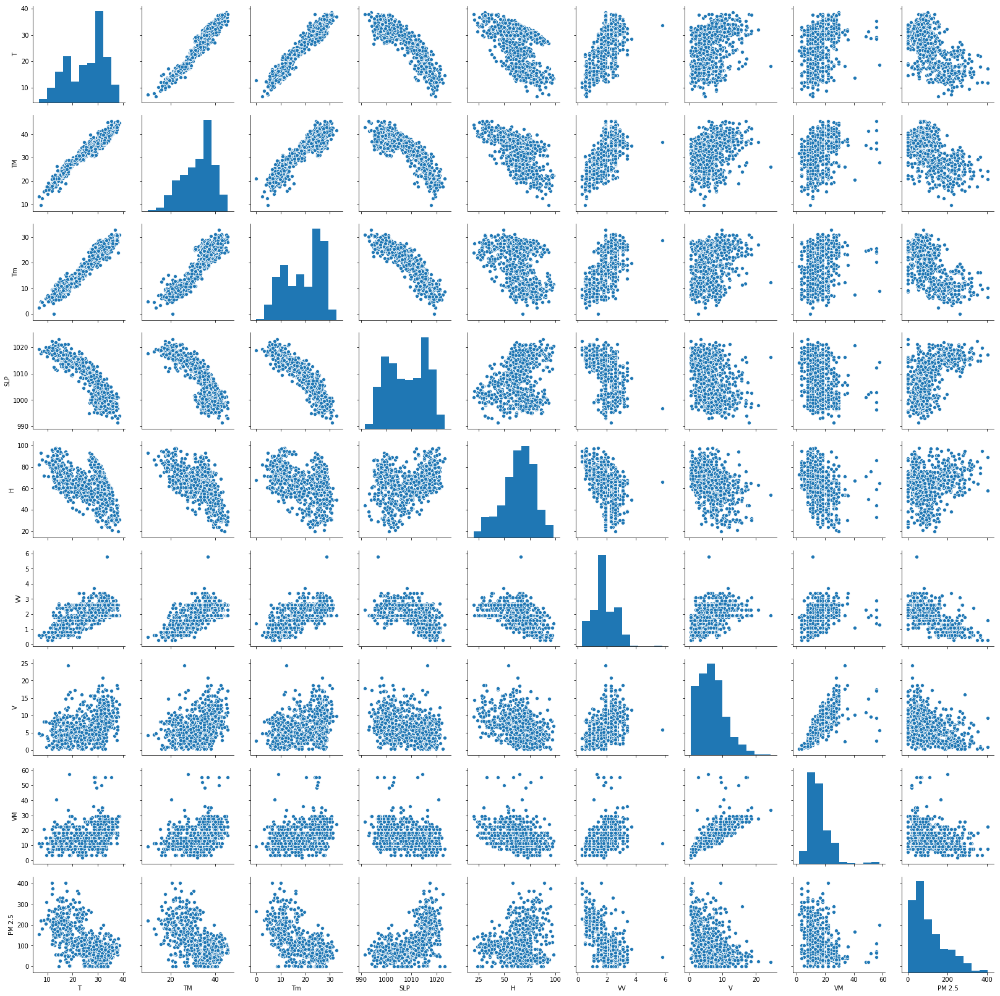

In [9]:
sns.pairplot(df)

In [10]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967276,0.958892,-0.884383,-0.518870,0.622637,0.326067,0.287138,-0.628336
TM,0.967276,1.000000,0.896699,-0.829254,-0.599629,0.598479,0.320116,0.299508,-0.569381
Tm,0.958892,0.896699,1.000000,-0.909514,-0.315305,0.560299,0.312904,0.259431,-0.669059
SLP,-0.884383,-0.829254,-0.909514,1.000000,0.274196,-0.491842,-0.346130,-0.299830,0.615615
H,-0.518870,-0.599629,-0.315305,0.274196,1.000000,-0.475279,-0.399079,-0.370981,0.174658
VV,0.622637,0.598479,0.560299,-0.491842,-0.475279,1.000000,0.402884,0.347493,-0.628621
V,0.326067,0.320116,0.312904,-0.346130,-0.399079,0.402884,1.000000,0.760777,-0.354799
VM,0.287138,0.299508,0.259431,-0.299830,-0.370981,0.347493,0.760777,1.000000,-0.283695
PM 2.5,-0.628336,-0.569381,-0.669059,0.615615,0.174658,-0.628621,-0.354799,-0.283695,1.000000


### <span style='color:Black'>  **Correlation Matrix with Heatmap** </span>

* Correlation states how the features are related to each other or the target variable.


* Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable).


* Heatmap makes it easy to identify which feature are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.

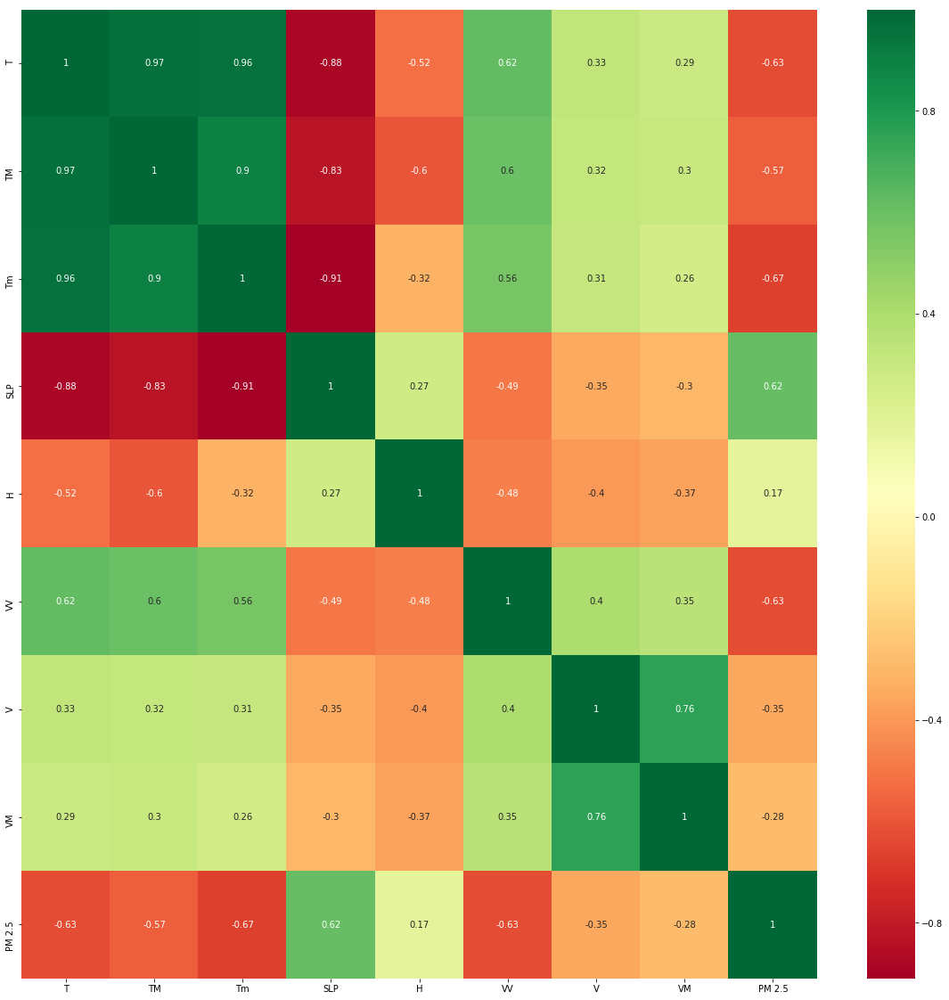

In [11]:
import seaborn as sns
#get the correlations of each feature in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [12]:
corrmat.index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

### <span style='color:Black'>  **Feature Importance**</span>

* You can get the feature importance of each feature of your dataset by using the feature importance property of the model.

* Feature importance gives you a score for each feature of your data, the higher the score more important or relevant is the feature towards your output variable.

* Feature importance is an inbuilt classs that comes with Tree Based Regressor, we will be using Extra Tree Regressor for extracting the top 10 features for the dataset.

In [13]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(X,y)

C:\Users\Ranjan\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


ExtraTreesRegressor(bootstrap=False, criterion='mse', max_depth=None,
          max_features='auto', max_leaf_nodes=None,
          min_impurity_decrease=0.0, min_impurity_split=None,
          min_samples_leaf=1, min_samples_split=2,
          min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
          oob_score=False, random_state=None, verbose=0, warm_start=False)

In [14]:
X.head()

,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2


In [15]:
print(model.feature_importances_)

[0.13648005 0.15688094 0.11330171 0.13897622 0.08427832 0.2867184
 0.04451431 0.03885004]


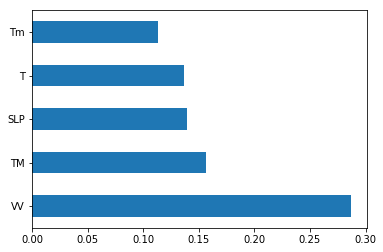

In [16]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

## <span style='color:Red'>  **Algorithm: Decision Tree Regressor** </span>

### <span style='color:Black'>  **Plotting for dataset**</span>

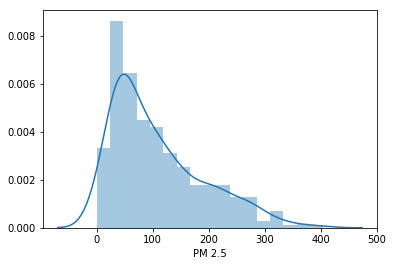

In [17]:
sns.distplot(y)

### <span style='color:Black'>  **Train Test split** </span>

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [19]:
from sklearn.tree import DecisionTreeRegressor

In [20]:
dtree=DecisionTreeRegressor(criterion="mse")

In [21]:
dtree.fit(X_train,y_train)

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [22]:
print("Coefficient of determination R^2 <-- on train set: {}".format(dtree.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: 1.0


In [23]:
print("Coefficient of determination R^2 <-- on test set: {}".format(dtree.score(X_test, y_test)))

Coefficient of determination R^2 <-- on test set: 0.28983838597609546


In [24]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(dtree,X,y,cv=5)

In [25]:
score.mean()

0.09847889419594844

### <span style='color:Black'>  **Tree Visualization** </span>

Scikit learn actually has some built-in visualization capabilities for decision trees,you won't use this often and it requires you to install the pydot library, but here is an example of what it looks like and the code to execute this:

In [26]:
##conda install pydotplus
## conda install python-graphviz

from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [27]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [28]:
import os

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [29]:
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data, feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

## <span style='color:Red'>  **Model Evaluation** </span>

### <span style='color:Black'>  **Data Plotting** </span>

In [30]:
prediction=dtree.predict(X_test)

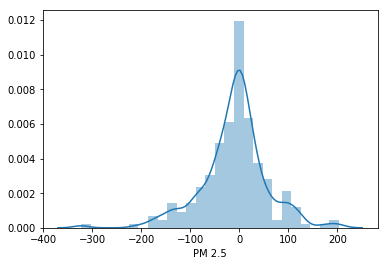

In [31]:
sns.distplot(y_test-prediction)

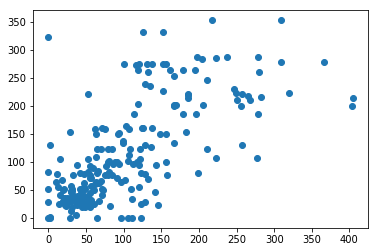

In [32]:
plt.scatter(y_test,prediction)

### <span style='color:Black'>  **Hyperparameter Tuning Decision Tree Regressor** </span>

In [ ]:
DecisionTreeRegressor()

In [33]:
## Hyper Parameter Optimization

params={
    "splitter"                :["best","random"],
    "max_depth"               :[3,4,5,6,8,10,12,15],
    "min_samples_leaf"        :[1,2,3,4,5],
    "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
    "max_features"            : ["auto","log2","sqrt",None],
    "max_leaf_nodes"          :[None,10,20,30,40,50,60,70]
}

In [34]:
## Hyperparameter optimization using GridSearchCV
from sklearn.model_selection import GridSearchCV

In [35]:
random_search=GridSearchCV(dtree,param_grid=params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)

In [36]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.'% (thour, tmin, round(tsec, 2)))

In [37]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X,y)
timer(start_time) # timing ends here "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 1456 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 7536 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done 16048 tasks      | elapsed:   22.4s
[Parallel(n_jobs=-1)]: Done 26992 tasks      | elapsed:   36.1s
[Parallel(n_jobs=-1)]: Done 40368 tasks      | elapsed:   52.4s
[Parallel(n_jobs=-1)]: Done 56176 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 74416 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 95088 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 102400 out of 102400 | elapsed:  2.2min finished



 Time taken: 0 hours 2 minutes and 11.08 seconds.


In [38]:
random_search.best_params_

{'max_depth': 12,
 'max_features': 'log2',
 'max_leaf_nodes': None,
 'min_samples_leaf': 1,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [39]:
random_search.best_score_

-2996.5321316760533

In [40]:
predictions=random_search.predict(X_test)

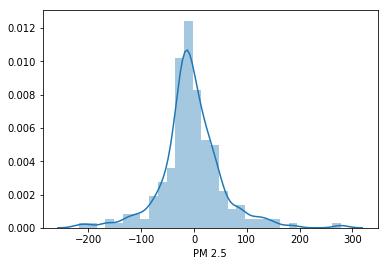

In [41]:
sns.distplot(y_test-predictions)

### <span style='color:Black'>  **Regression Evaluation Metrics** </span>

Here are three common metrics for regression problems:

* **Mean Absolute Error** (MAE) is the mean of the absolute value of the errors:
$$\frac{1}{n}\sum_{i=1}^{n}|{y_i-\hat{y_i}}|$$

* **Mean Squared Error** (MSE) is the mean of the squared errors:
$$\frac{1}{n}\sum_{i=1}^{n}(y_i-\hat{y_i})^2$$

* **Root Mean Squared Error** (RMSE) is the square root of the mean of the squared errors:
$$\sqrt{\frac{1}{n}\sum_{i=1}^{n}(y_i-\hat{y_i})^2}$$

Comparing these metrics:

* **MAE** is the easiest to understand, because it's the average error.
* **MSE** is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
* **RMSE** is even more popular than MSE, because RMSE is interpretable in the "y" units.

All of these are **loss functions**, because we want to minimize them.

In [45]:
from sklearn import metrics

In [46]:
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 46.94471080669711
MSE: 4636.04426671106
RMSE: 68.08850319041431


In [47]:
import pickle

In [48]:
# open a file, where you want to store the data
file = open('decision_regression_model.pkl','wb')

# dump information to that file
pickle.dump(random_search, file)

<span style='color:Red'>  **The End** </span>